In [1]:
!pip install kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79.9 MB 1.2 MB/s 


In [2]:
import os
import random 
import datetime
import numpy as np
import pandas as pd 
import tensorflow as tf
import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt


from PIL import Image
from numba import cuda
from keras.applications.mobilenet import MobileNet
from tensorboard.plugins.hparams import api as hp
from sklearn.model_selection import train_test_split

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Data Insigths

In [ ]:
directory = '/content/drive/MyDrive/Age_Data/data'
age_df = pd.DataFrame(columns = ["Label", "Photo path"])

for dir in os.listdir(directory):
    label_dir = os.path.join(directory, dir)
    for f in os.listdir(label_dir):
        photo = os.path.join(label_dir, f)
        if os.path.isfile(photo):
            row = [dir, photo]
            age_df.loc[len(age_df)] = row 
age_df = age_df.sort_values(by = "Label")

In [ ]:
fig = px.histogram(age_df, x="Label")
fig.update_layout(title = "Distribution of classes in dataset")
fig.show()
pio.write_image(fig, '/content/drive/MyDrive/Age_Data/distribution_plot.png', scale=6, width = 1000, height = 600)

In [ ]:
classes_no = len(age_df['Label'].unique())
classes_no

99

## Data Preprocessing and Train/Val/Test Split

In [ ]:
def generate_pixels_from_png(df):
    df['Pixels'] = [Image.open(path) for path in df['Photo path']]
    df['Pixels'] = [image.convert('RGB') for image in df['Pixels']]
    df['Pixels'] = [np.array(image)/255 for image in df['Pixels']]
    return df

In [ ]:
tmp = generate_pixels_from_png(age_df)

Start
First step done
Second steo done
Third step done


In [ ]:
# Train, validation and testing split 
test_size = 0.02
seed = 42
X_train, X_test, Y_train, Y_test = train_test_split(age_df['Pixels'].to_list(), 
                                                    age_df['Label'].to_list(),
                                                    test_size=test_size, 
                                                    random_state=seed,
                                                    shuffle=True)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2)

In [ ]:
# save to files
# np.save('/content/drive/MyDrive/Age_Data/X_train.npy', X_train)
# np.save('/content/drive/MyDrive/Age_Data/Y_train.npy', Y_train)
# np.save('/content/drive/MyDrive/Age_Data/X_val.npy', X_val)
# np.save('/content/drive/MyDrive/Age_Data/Y_val.npy', Y_val)
# np.save('/content/drive/MyDrive/Age_Data/X_test.npy', X_test)
# np.save('/content/drive/MyDrive/Age_Data/Y_test.npy', Y_test)

## Model Building

In [32]:
X_train = np.load('/content/drive/MyDrive/Age_Data/X_train.npy')
Y_train = np.load('/content/drive/MyDrive/Age_Data/Y_train.npy')
X_val = np.load('/content/drive/MyDrive/Age_Data/X_val.npy')
Y_val = np.load('/content/drive/MyDrive/Age_Data/Y_val.npy')
X_test = np.load('/content/drive/MyDrive/Age_Data/X_test.npy')
Y_test = np.load('/content/drive/MyDrive/Age_Data/Y_test.npy')

Photo of person age 1.0


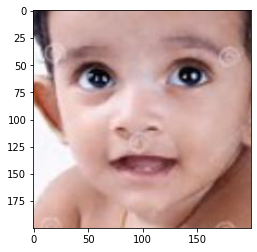

In [5]:
#Read photo and pixels
print(f"Photo of person age {Y_train[2]}")
plt.imshow(X_train[2])

In [47]:
def plot_photos_predictions(model, X, Y, range_start, range_end):
  prediction = model.predict(X[range_start:range_end])
  fig, m_axs = plt.subplots(int((range_end-range_start)/2), 2, figsize = (16, 32))

  for i, ax in zip(range(range_start,range_end), m_axs.flatten()):
    ax.imshow(X[i])
    ax.set_title('Age: %2.1f\nPredicted Age: %2.1f' % (Y[i], prediction[i-range_start]))
    ax.axis('off')


In [8]:
##Batch for overfitting = 
X_train_batch = X_train[:500]
Y_train_batch = Y_train[:500]

In [57]:
def run(hparams, log_dir):

  with tf.summary.create_file_writer(log_dir).as_default():
    hp.hparams_config(
      hparams=[HP_ALPHA, HP_DEPTH_MULTI, HP_DROPOUT, HP_POOLING],
      metrics=[hp.Metric(METRIC_MEAN_ABSOLUTE_ERROR, display_name='Mean Absolute Error')],
    )
  
  mobilenet_baseline = MobileNet(input_shape=(200, 200, 3),
                                 include_top=False,
                                 alpha=hparams[HP_ALPHA],
                                 depth_multiplier=hparams[HP_DEPTH_MULTI], 
                                 dropout=hparams[HP_DROPOUT],
                                 pooling=hparams[HP_POOLING])

  mobilenet = tf.keras.Sequential()
  mobilenet.add(mobilenet_baseline)
  mobilenet.add(tf.keras.layers.Flatten())
  mobilenet.add(tf.keras.layers.Dense(1,activation='relu')) 

  mobilenet.compile(optimizer = 'adam', loss = 'mean_absolute_error', metrics = ['mean_absolute_error'])


  filepath_checkpoint = os.path.join(MAIN_DIR,'checkpoint/')

  # Load model weights from file
  # mobilenet.load_weights(filepath_checkpoint)

  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=filepath_checkpoint,
                                                                save_weights_only=True,
                                                                monitor='loss',
                                                                mode='max',
                                                                save_best_only=True)


  mobilenet.summary()

  outcome = mobilenet.fit(X_train_batch, Y_train_batch, epochs=20, validation_data = (X_val, Y_val), callbacks=[tensorboard_callback, 
                                                      early_stopping_callback, 
                                                      model_checkpoint_callback,
                                                      hp.KerasCallback(log_dir, hparams)], batch_size = 32)
  mae = min(outcome.history['val_mean_absolute_error'])
  with tf.summary.create_file_writer(log_dir).as_default():
    tf.summary.scalar(METRIC_MEAN_ABSOLUTE_ERROR, mae, step=1)

  return mobilenet

## Model Training

In [58]:
MAIN_DIR = '/content/drive/MyDrive/Age_Data/logs'

HP_ALPHA = hp.HParam('alpha', hp.Discrete([1.0]))
HP_DEPTH_MULTI = hp.HParam('depth_multiplier', hp.Discrete([1]))
HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.001]))
HP_POOLING = hp.HParam('pooling', hp.Discrete(['avg', 'max']))
METRIC_MEAN_ABSOLUTE_ERROR = 'mean_absolute_error'

In [59]:
for alpha in HP_ALPHA.domain.values:
  for depth in HP_DEPTH_MULTI.domain.values:
    for dropout in HP_DROPOUT.domain.values: 
      for pooling in HP_POOLING.domain.values:
        hparams = {
            HP_ALPHA: alpha,
            HP_DEPTH_MULTI: depth, 
            HP_DROPOUT: dropout, 
            HP_POOLING: pooling
        }
        print({h.name: hparams[h] for h in hparams})
        log_dir = os.path.join(MAIN_DIR,'fit/') + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        print(log_dir)
        mobilenet = run(hparams, log_dir)


{'alpha': 1.0, 'depth_multiplier': 1, 'dropout': 0.001, 'pooling': 'avg'}
/content/drive/MyDrive/Age_Data/logs/fit/20221214-130116
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 flatten_9 (Flatten)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 1)                 1025      
                                                                 
Total params: 3,229,889
Trainable params: 3,208,001
Non-trainable params: 21,888
_________________________________________________________________
Epoch 1/20
16/16 [==============================] - 9s 442ms/step - loss: 19.6005 - mean_absolute_error: 1

{'alpha': 1.0, 'depth_multiplier': 1, 'dropout': 0.001, 'pooling': 'max'}
/content/drive/MyDrive/Age_Data/logs/fit/20221214-130259
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 flatten_10 (Flatten)        (None, 1024)              0         
                                                                 
 dense_10 (Dense)            (None, 1)                 1025      
                                                                 
Total params: 3,229,889
Trainable params: 3,208,001
Non-trainable params: 21,888
_________________________________________________________________
Epoch 1/20
16/16 [==============================] - 9s 419ms/step - loss: 14.2308 - mean_absolute_error: 

1/1 [==============================] - 0s 387ms/step


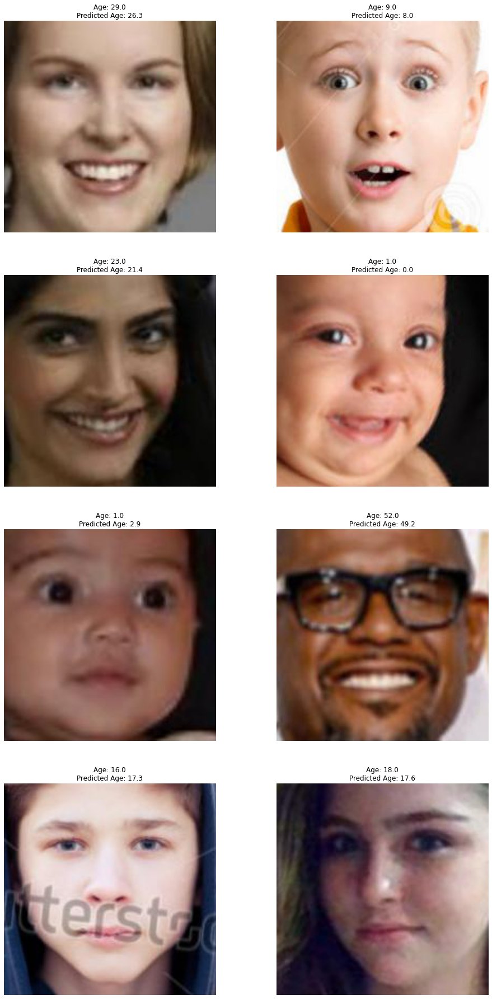

In [60]:
## Checking predictions on train set
plot_photos_predictions(mobilenet, X_train_batch, Y_train_batch, 8, 16)

1/1 [==============================] - 0s 57ms/step


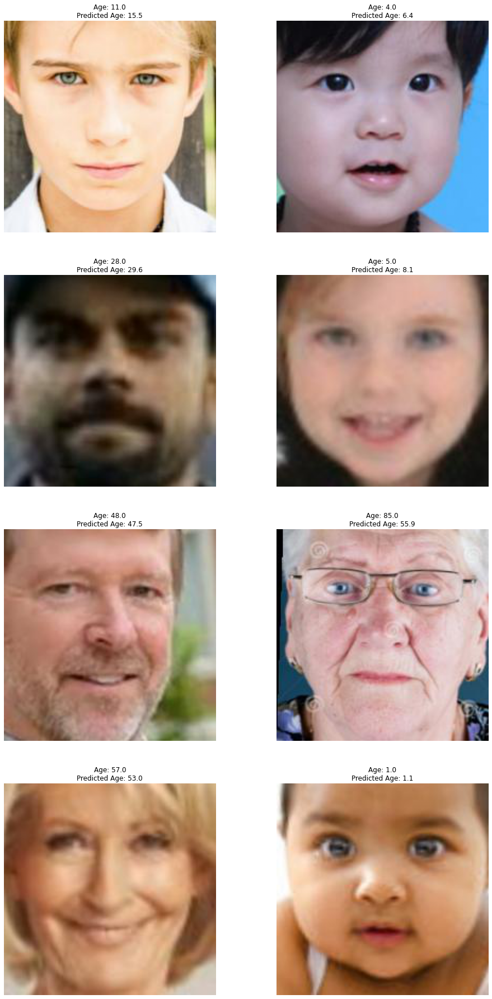

In [61]:
## Checking predictions on train set
plot_photos_predictions(mobilenet, X_val, Y_val, 0, 8)

## Tensorboard

In [25]:
!kill 801

In [27]:
%reload_ext tensorboard

In [26]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Age_Data/logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## MODEL TESTS

In [62]:
output = mobilenet.evaluate(X_test, Y_test)
print(f"The mean average error on the test set is {output[-1]} years")

7/7 [==============================] - 0s 32ms/step - loss: 7.3725 - mean_absolute_error: 7.3725
The mean average error on the test set is 7.3724894523620605 years


1/1 [==============================] - 0s 24ms/step


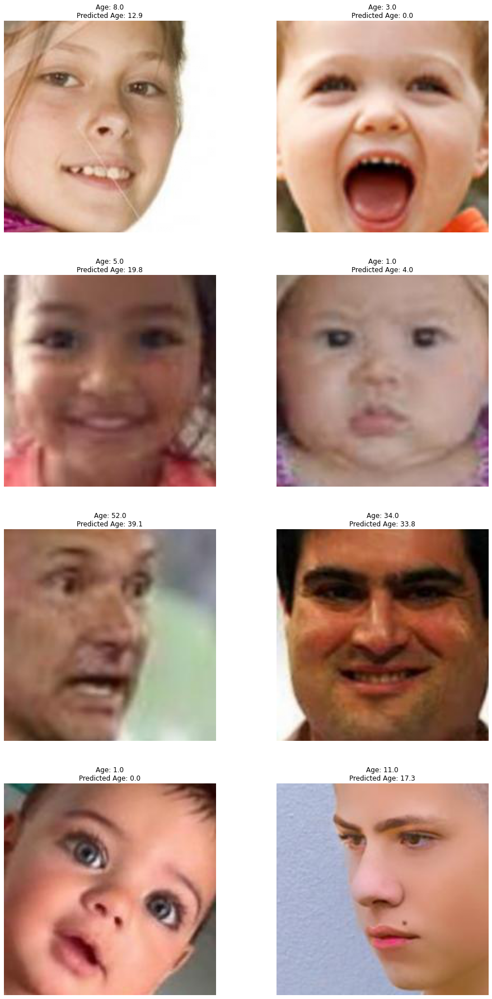

In [63]:
## Checking predictions on train set
plot_photos_predictions(mobilenet, X_test, Y_test, 0, 8)

## PERSONAL DATA TEST

1/1 [==============================] - 0s 22ms/step
Person on the photo is predicted to be 21.0 years old


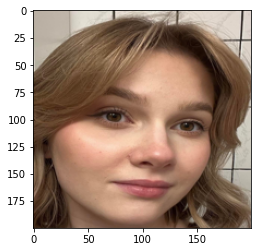

In [95]:
path_to_check = "/content/domi_test.jpg"
image = Image.open(path_to_check)
image = image.resize((200,200))
immge = image.convert('RGB')
plt.imshow(image)
image = np.array(image)/255

image = np.expand_dims(image,axis=0)
predicted_age = mobilenet.predict(image)
print(f"Person on the photo is predicted to be {round(predicted_age[0][0],0)} years old")